# Chaotic Attractors

In [2]:
import numpy as np
import matplotlib.pyplot as plt 
from PIL import Image
from scipy.integrate import odeint
from sklearn.decomposition import PCA
from skimage.measure import find_contours

%matplotlib inline
%config InlineBackend.figure_format='retina'
plt.rcParams.update({
    "text.usetex": True,
})

## Lorenz System

$r = 28$

$s = 10$

$b = \frac{8}{3}$

$\frac{dx}{dt} = s(y-x)$

$\frac{dy}{dt} = x(r-z) - y$

$\frac{dz}{dt} = xy - bz$


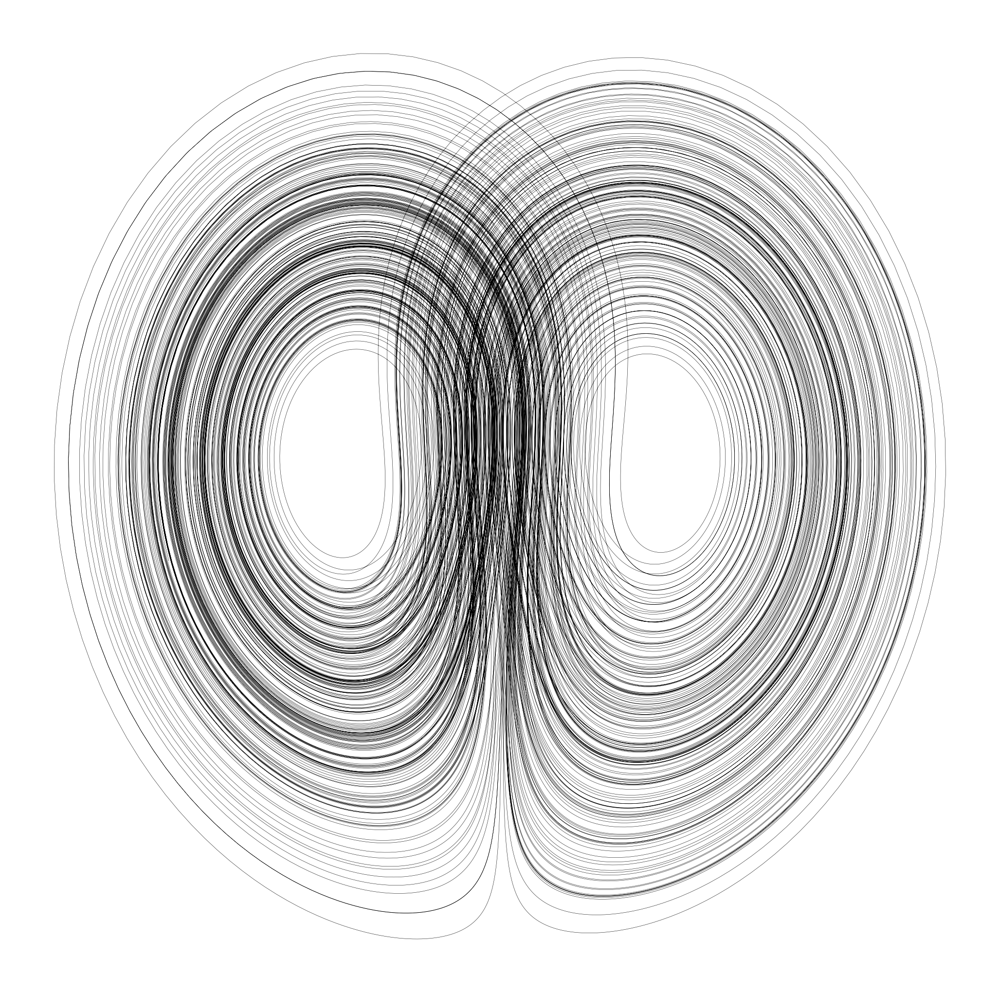

In [3]:
def lorenz(u, t):
    x, y, z = u
    r, s, b = 28, 10, 8/3
    dxdt = s*(y - x)
    dydt = x*(r - z) - y
    dzdt = x*y - b*z
    return [dxdt, dydt, dzdt]

t_0 = 0
dt = .005
t_final = 300
t = np.arange(t_0, t_final, dt)
u0 = [-11.93682102, -18.72739695, 21.93412473]
sol = odeint(lorenz, u0, t)

fig = plt.figure(figsize=(13,13))
plt.plot(*sol.T[1:], lw=.2, c='k')
plt.axis("off")
plt.show()

## Proto-Lorenz system
### Cubic Cover

$\frac{dp}{dt} = \frac{1}{3}\big(-(\sigma+1)p+(\sigma-r+z)q\big)+\big((1-\sigma)(p^2-q^2)+2(r+\sigma-z)pq\big)\big/3M$

$\frac{dq}{dt} = \frac{1}{3}\big((r-\sigma-z)p-(\sigma+1)q\big)+\big(2(\sigma-1)pq+(r+\sigma-z)(p^2-q^2)\big)\big/3M$

$\frac{dz}{dt} = \frac{1}{2}(3p^2q-q^3)-bz$

$M = \sqrt{p^2+q^2}$

$r = 28, \sigma = 10, b = \frac{8}{3}$

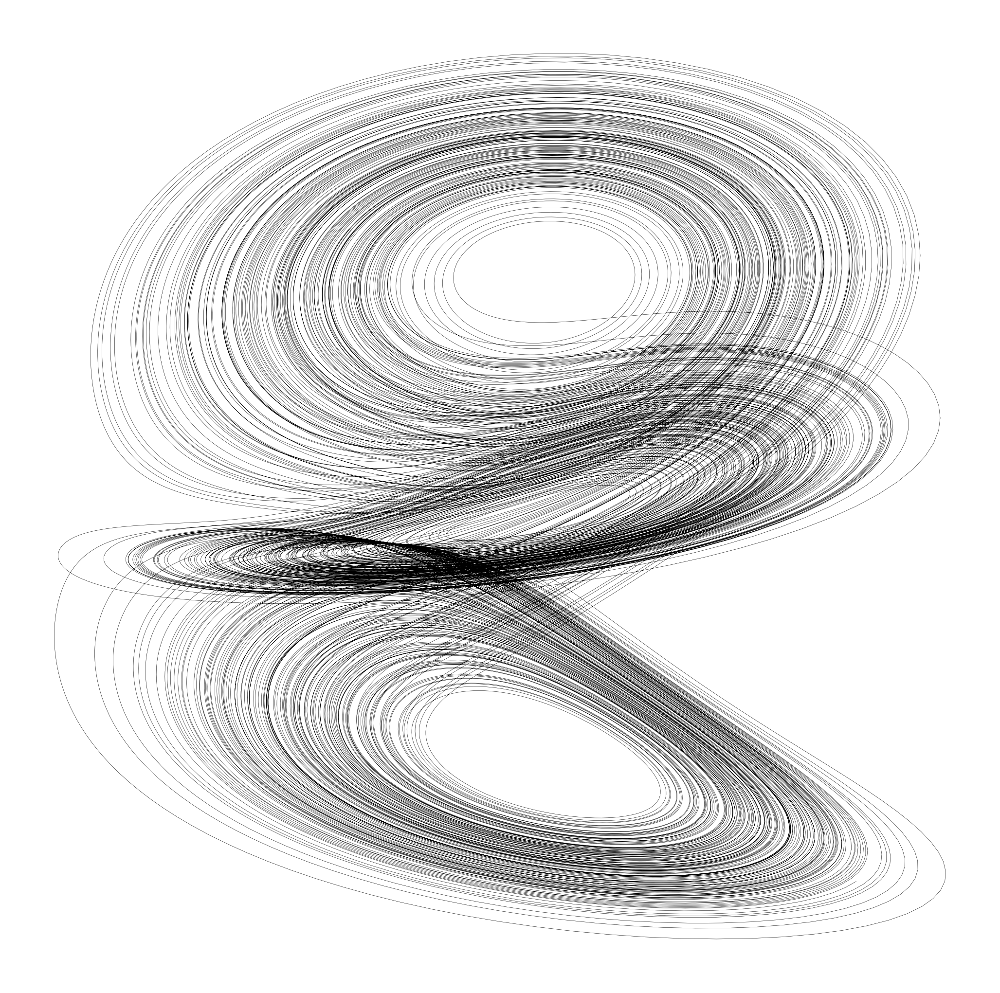

In [4]:
def cubicCover(u, t):
    p, q, z = u  
    r, s, b = 28.0, 10.0, 8.0/3.0
    M = np.sqrt(p**2 + q**2)
    dpdt = 1/3 * (-(s + 1)*p + (s - r + z)*q) + ((1 - s)*(p**2 - q**2) + 2*(r + s - z)*p*q)/(3*M)
    dqdt = 1/3 * ((r - s - z)*p - (s + 1)*q) + (2*(s - 1)*p*q + (r + s - z)*(p**2 - q**2))/(3*M)
    dzdt = 1/2 * (3*p**2*q - q**3) - b*z
    return [dpdt, dqdt, dzdt]

t_0 = 0
dt = .005
t_final = 300
t = np.arange(t_0, t_final, dt)
u0 = [-1.1716624, -1.96764881, 26.83603364]
sol = odeint(cubicCover, u0, t)

pca = PCA(n_components=2)
sol = pca.fit_transform(sol)

fig = plt.figure(figsize=(13,13))
plt.plot(*sol.T, lw=.2, c='k')
plt.axis("off")
plt.show()

## Proto-Lorenz system
### Quartic Cover


$\frac{dx}{dt} = \big(-ax^3+(2a+r-z)x^2y+(a-2)xy^2-(r-z)y^3\big)\big/\big(2(x^2+y^2)\big)$

$\frac{dy}{dt} = \big((r-z)x^3+(a-2)x^2y+(-2a-r+z)xy^2-ay^3\big)\big/\big(2(x^2+y^2)\big)$

$\frac{dz}{dt} = 2x^3y-2xy^3-bz$

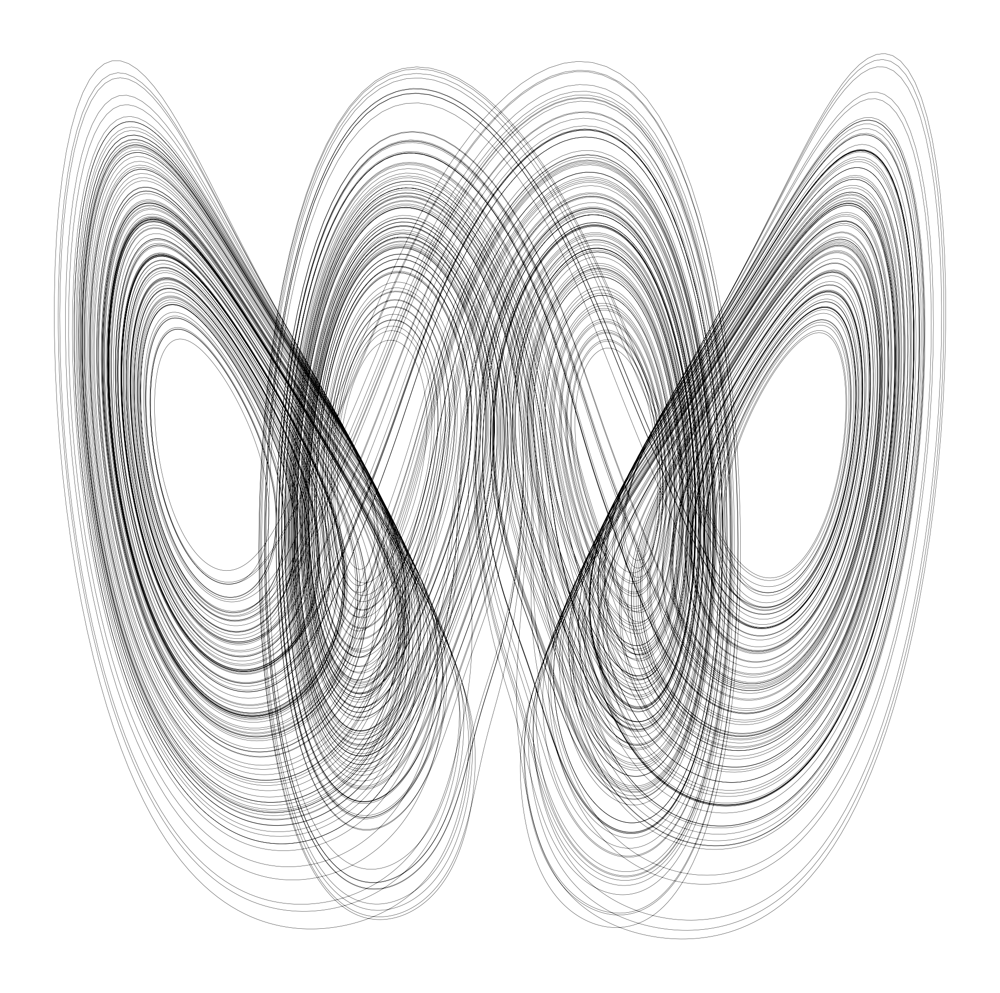

In [5]:
def quarticCover(u, t):
    x, y, z = u
    r, a, b = 28.0, 10.0, 8.0/3.0
    dxdt = (-a*x**3 + (2*a+r-z)*x**2*y + (a-2)*x*y**2 - (r-z)*y**3) / (2*(x**2+y**2))
    dydt = ((r-z)*x**3 + (a-2)*x**2*y + (-2*a-r+z)*x*y**2 - a*y**3) / (2*(x**2+y**2))
    dzdt = 2*x**3*y - 2*x*y**3 - b*z
    return [dxdt, dydt, dzdt]

t_0 = 0
dt = .005
t_final = 300
t = np.arange(t_0, t_final, dt)
u0 = [-1.95837841, -0.76304091, 21.43902472]
sol = odeint(quarticCover, u0, t)

fig = plt.figure(figsize=(13,13))
plt.plot(*sol.T[1:], lw=.2, c='k')
plt.axis("off")
plt.show()

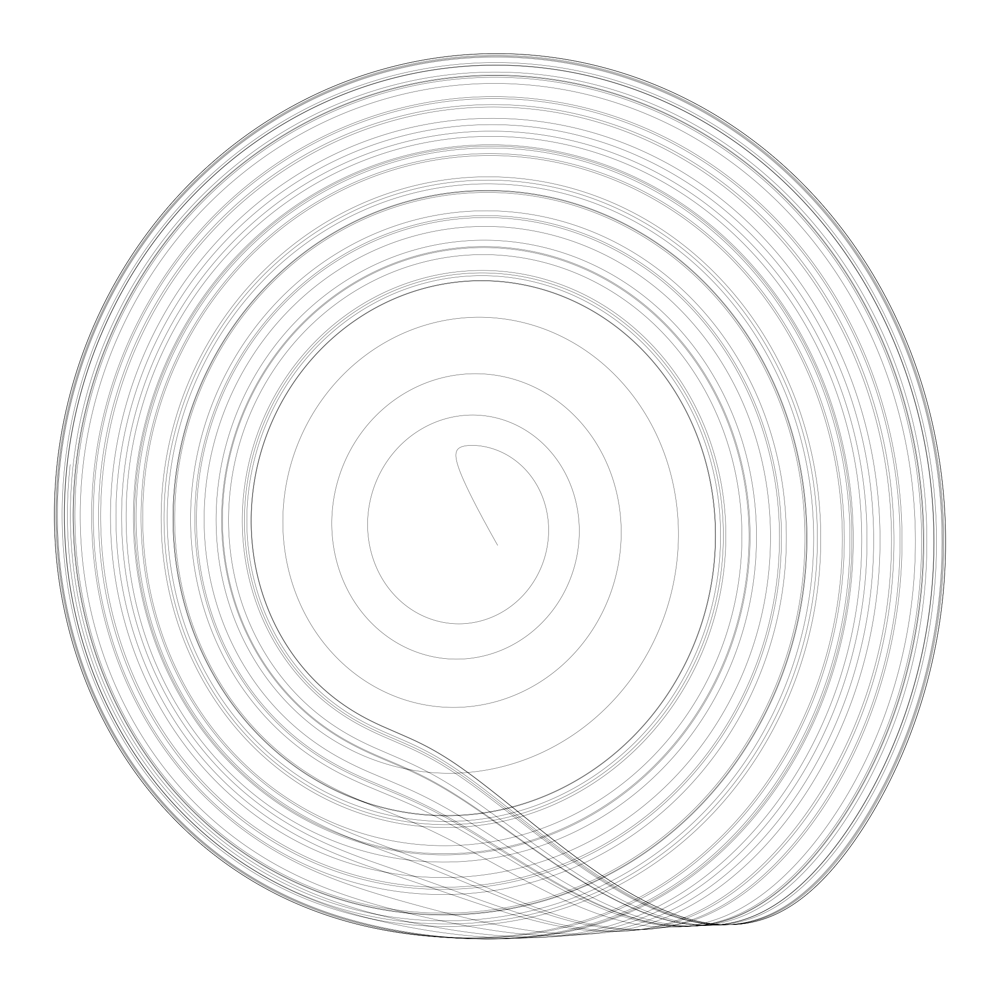

In [6]:
def rossler(u, t):
    x, y, z = u
    a, b, c = 0.1, 0.1, 14
    dxdt = -y - z
    dydt = x + a*y
    dzdt = b + z*(x - c)
    return [dxdt, dydt, dzdt]

t_0 = 0
dt = .005
t_final = 300
t = np.arange(t_0, t_final, dt)
u0 = [-1.1716624, -1.96764881, 26.83603364]
sol = odeint(rossler, u0, t)
pca = PCA(n_components=2)
sol = pca.fit_transform(sol)
fig = plt.figure(figsize=(13,13))
plt.plot(*sol.T, lw=.2, c='k')
plt.axis("off")
plt.show()

## Three-Scroll Unified Chaotic System

$a=40, b=55, c=11/6, d=0.16, e=0.65, f=20$

$\frac{dx}{dt} = a(y-x) + dxz$

$\frac{dy}{dt} = bx - xz + fy$

$\frac{dz}{dt} = -ex^2 + xy + cz$

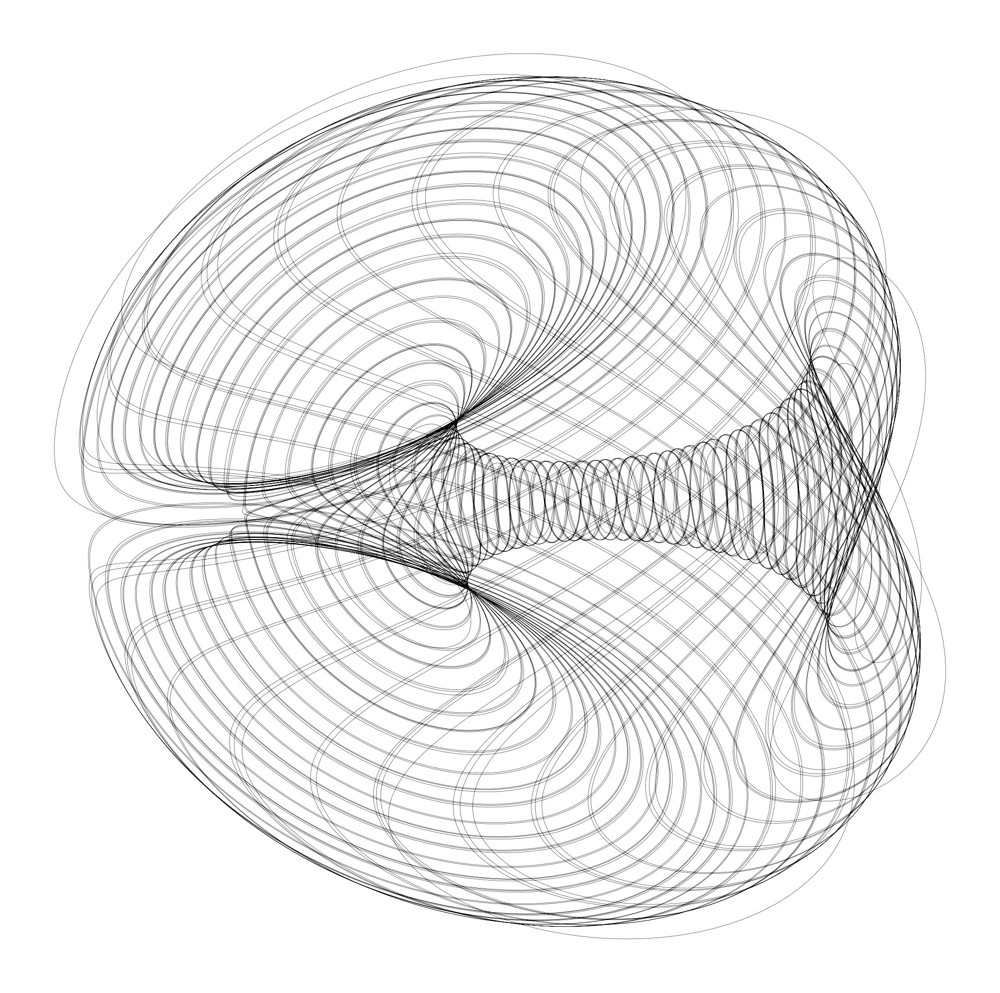

In [7]:
def threeScrollUnified(u, t):
    x, y, z = u
    a, b, c, d, e, f = 40, 44, 11/6, .16, .65, 20
    dxdt = a*(y-x) + d*x*z
    dydt = b*x - x*z + f*y
    dzdt = -e*x**2 + x*y + c*z
    return [dxdt, dydt, dzdt]

t_0 = 0
dt = .0005
t_final = 30
t = np.arange(t_0, t_final, dt)
u0 = [-1.1716624, -1.96764881, 26.83603364]
sol = odeint(threeScrollUnified, u0, t)
pca = PCA(n_components=2)
sol = pca.fit_transform(sol)
fig = plt.figure(figsize=(13,13))
plt.plot(*sol.T, lw=.2, c='k')
plt.axis("off")
plt.show()